# Настройка среды

In [325]:
!pip install -U kaleido

In [329]:
# Библиотеки для математики и табличных расчётов
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
import pandas as pd

# Библиотеки для визуализаций
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from kaleido.scopes.plotly import PlotlyScope
from IPython.display import Image, display
sns.set_theme()
%matplotlib inline

# Фреймворки глубокого обучения
import keras
from keras import backend as K
import tensorflow as tf

# Методы масштабирования и обработки данных
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Методы для декомпозиции временных рядов
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.seasonal import seasonal_decompose

# Вспомогательные бибилиотект
from copy import deepcopy
import sys
import os
import tqdm
import json

In [327]:
PLOTLY_SCOPE = PlotlyScope()

In [3]:
if tf.test.gpu_device_name() == '/device:GPU:0':
  device = tf.test.gpu_device_name()
else:
  device = "/cpu:0"

device

'/device:GPU:0'

# Подгрузка данных

Данные брались из Kaggle: https://www.kaggle.com/datasets/prasoonkottarathil/btcinusd

Это информация по Биткойну за 2017 год. В таблице есть данные такие данные: максимальна и минимальная цена Биткойна в USD, цена открытия и закрытия Биткойна в USD, кол-во циркулирующих USD и Биткойнов. Данные взяты с периодичностью в одну минуту

In [5]:
df = pd.read_csv("BTC-2017min.csv")
df

,unix,date,symbol,open,high,low,close,Volume BTC,Volume USD
0,1514764740,2017-12-31 23:59:00,BTC/USD,13913.28,13913.28,13867.18,13880.00,0.591748,8213.456549
1,1514764680,2017-12-31 23:58:00,BTC/USD,13913.26,13953.83,13884.69,13953.77,1.398784,19518.309658
2,1514764620,2017-12-31 23:57:00,BTC/USD,13908.73,13913.26,13874.99,13913.26,0.775012,10782.944294
3,1514764560,2017-12-31 23:56:00,BTC/USD,13827.00,13908.69,13827.00,13859.58,0.666459,9236.841134
4,1514764500,2017-12-31 23:55:00,BTC/USD,13825.05,13825.05,13825.05,13825.05,0.065501,905.560130
...,...,...,...,...,...,...,...,...,...
525594,1483229100,2017-01-01 00:05:00,BTC/USD,966.43,966.43,966.43,966.43,0.107000,103.408010
525595,1483229040,2017-01-01 00:04:00,BTC/USD,966.37,966.37,966.37,966.37,0.000000,0.000000
525596,1483228980,2017-01-01 00:03:00,BTC/USD,966.37,966.37,966.37,966.37,0.000000,0.000000
525597,1483228920,2017-01-01 00:02:00,BTC/USD,966.16,966.37,966.16,966.37,8.087376,7815.397864


# Анализ и очистка данных

Выводим информацию о наших данных

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525599 entries, 0 to 525598
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   unix        525599 non-null  int64  
 1   date        525599 non-null  object 
 2   symbol      525599 non-null  object 
 3   open        525599 non-null  float64
 4   high        525599 non-null  float64
 5   low         525599 non-null  float64
 6   close       525599 non-null  float64
 7   Volume BTC  525599 non-null  float64
 8   Volume USD  525599 non-null  float64
dtypes: float64(6), int64(1), object(2)
memory usage: 36.1+ MB


Преобразуем колонку date из формата обьекта в формат DateTime

In [8]:
df["date"] = pd.to_datetime(df["date"])
df

,unix,date,symbol,open,high,low,close,Volume BTC,Volume USD
0,1514764740,2017-12-31 23:59:00,BTC/USD,13913.28,13913.28,13867.18,13880.00,0.591748,8213.456549
1,1514764680,2017-12-31 23:58:00,BTC/USD,13913.26,13953.83,13884.69,13953.77,1.398784,19518.309658
2,1514764620,2017-12-31 23:57:00,BTC/USD,13908.73,13913.26,13874.99,13913.26,0.775012,10782.944294
3,1514764560,2017-12-31 23:56:00,BTC/USD,13827.00,13908.69,13827.00,13859.58,0.666459,9236.841134
4,1514764500,2017-12-31 23:55:00,BTC/USD,13825.05,13825.05,13825.05,13825.05,0.065501,905.560130
...,...,...,...,...,...,...,...,...,...
525594,1483229100,2017-01-01 00:05:00,BTC/USD,966.43,966.43,966.43,966.43,0.107000,103.408010
525595,1483229040,2017-01-01 00:04:00,BTC/USD,966.37,966.37,966.37,966.37,0.000000,0.000000
525596,1483228980,2017-01-01 00:03:00,BTC/USD,966.37,966.37,966.37,966.37,0.000000,0.000000
525597,1483228920,2017-01-01 00:02:00,BTC/USD,966.16,966.37,966.16,966.37,8.087376,7815.397864


Для того, чтобы уменьшить кол-во данных с которым мы работаем произведём их ресемплинг. Перевведём шаг повремени из 1-й минуты в формат 5-и минут. Информацию из 5-минутных окон будем доставать с помощью среднего арифметического, таки образом мы не потеряем выделяющиеся данные из выбокри

In [9]:
df = df.set_index(["date"])
df = df.resample("5T").mean()
df

<ipython-input-9-b9537ac36471>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.resample("5T").mean()


,unix,open,high,low,close,Volume BTC,Volume USD
date,,,,,,,
2017-01-01 00:00:00,1.483229e+09,966.310,966.3625,966.310,966.3625,3.924344,3792.311316
2017-01-01 00:05:00,1.483229e+09,966.550,966.5500,966.550,966.5500,0.087746,84.810792
2017-01-01 00:10:00,1.483230e+09,966.062,966.0700,965.740,965.9440,1.332354,1286.852444
2017-01-01 00:15:00,1.483230e+09,965.706,965.9020,965.562,965.7580,4.154677,4015.629036
2017-01-01 00:20:00,1.483230e+09,966.104,966.1440,965.770,965.8100,0.134185,129.540864
...,...,...,...,...,...,...,...
2017-12-31 23:35:00,1.514763e+09,13960.332,13994.8840,13944.038,13979.4440,5.012946,70104.496883
2017-12-31 23:40:00,1.514764e+09,13957.382,13972.3840,13939.072,13945.6460,4.361250,60746.208537
2017-12-31 23:45:00,1.514764e+09,13928.664,13944.1760,13917.474,13926.0540,2.272551,31655.437626


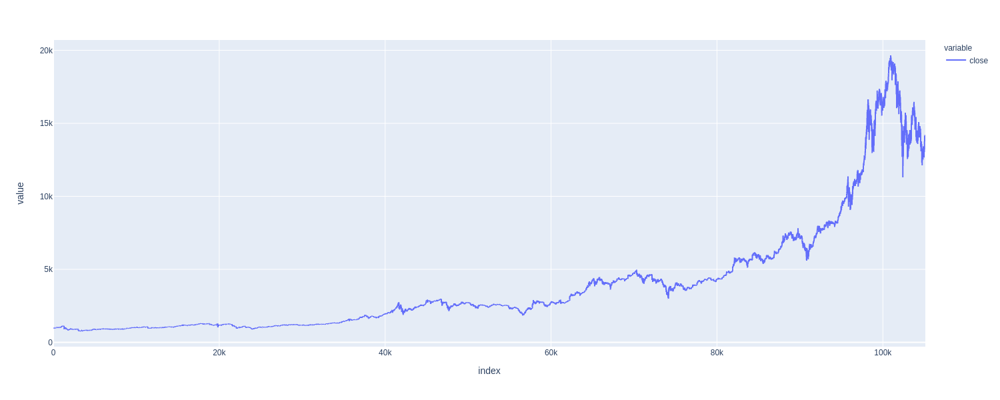

In [333]:
fig = px.line(df["close"])
fig.update_layout(
  autosize=False,
  width=1500,
  height=600,
)

Image(PLOTLY_SCOPE.transform(fig, format="png", scale=1))

In [334]:
px.line(df["close"])

Возвращаем старую индексацию в формате цифр, а не даты и времени

In [11]:
df = df.reset_index()
df

,date,unix,open,high,low,close,Volume BTC,Volume USD
0,2017-01-01 00:00:00,1.483229e+09,966.310,966.3625,966.310,966.3625,3.924344,3792.311316
1,2017-01-01 00:05:00,1.483229e+09,966.550,966.5500,966.550,966.5500,0.087746,84.810792
2,2017-01-01 00:10:00,1.483230e+09,966.062,966.0700,965.740,965.9440,1.332354,1286.852444
3,2017-01-01 00:15:00,1.483230e+09,965.706,965.9020,965.562,965.7580,4.154677,4015.629036
4,2017-01-01 00:20:00,1.483230e+09,966.104,966.1440,965.770,965.8100,0.134185,129.540864
...,...,...,...,...,...,...,...,...
105115,2017-12-31 23:35:00,1.514763e+09,13960.332,13994.8840,13944.038,13979.4440,5.012946,70104.496883
105116,2017-12-31 23:40:00,1.514764e+09,13957.382,13972.3840,13939.072,13945.6460,4.361250,60746.208537
105117,2017-12-31 23:45:00,1.514764e+09,13928.664,13944.1760,13917.474,13926.0540,2.272551,31655.437626
105118,2017-12-31 23:50:00,1.514764e+09,13888.714,13907.1420,13853.098,13886.7680,4.719074,65495.112686


Проверяем данные на отсутвующие значения

In [12]:
df.isna().sum()

date          0
unix          0
open          0
high          0
low           0
close         0
Volume BTC    0
Volume USD    0
dtype: int64

Отсутсвующих значений нет. По этому продолжаем расчёты дальше

Производим декомпозицию временного ряда, чтобы отследить возмоные закономерности

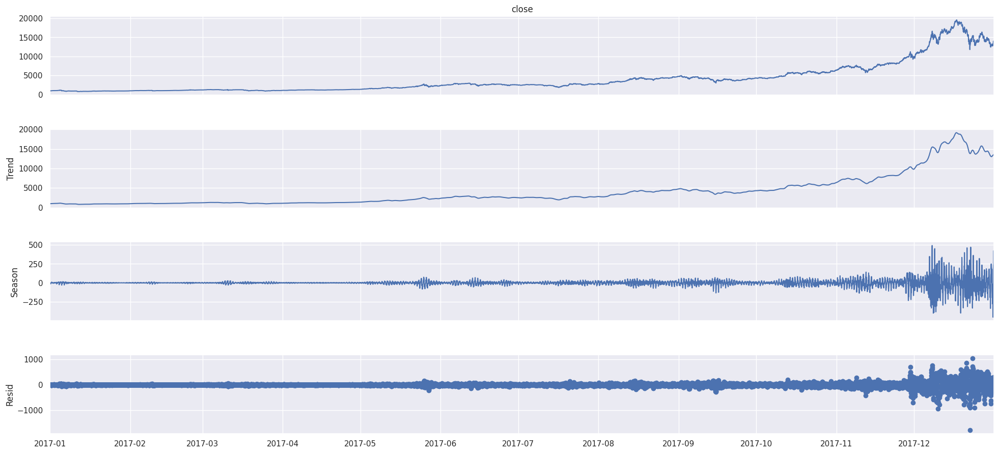

In [13]:
result = STL(df.set_index("date").resample("H").mean()["close"]).fit()

fig = result.plot()
fig.set_size_inches((23, 10))
plt.show()

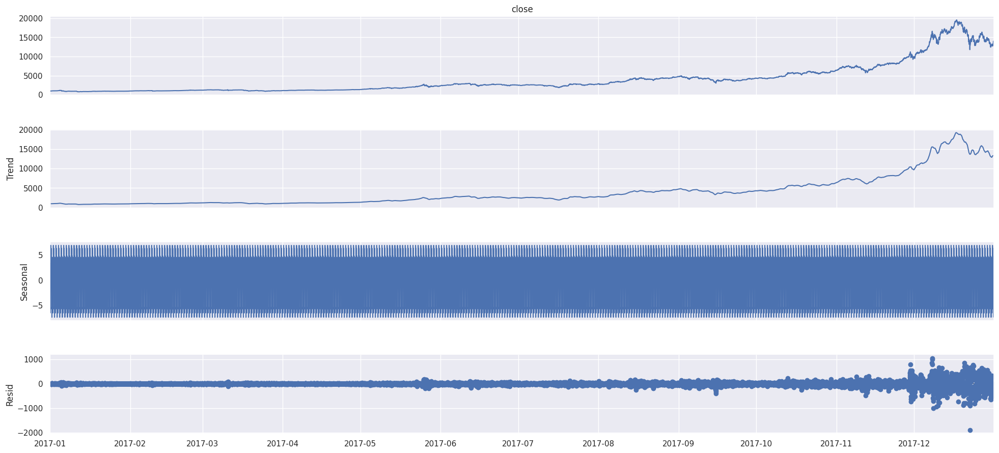

In [14]:
result = seasonal_decompose(df.set_index("date").resample("H").mean()["close"], model="additive")

fig = result.plot()
fig.set_size_inches((23, 10))
plt.show()

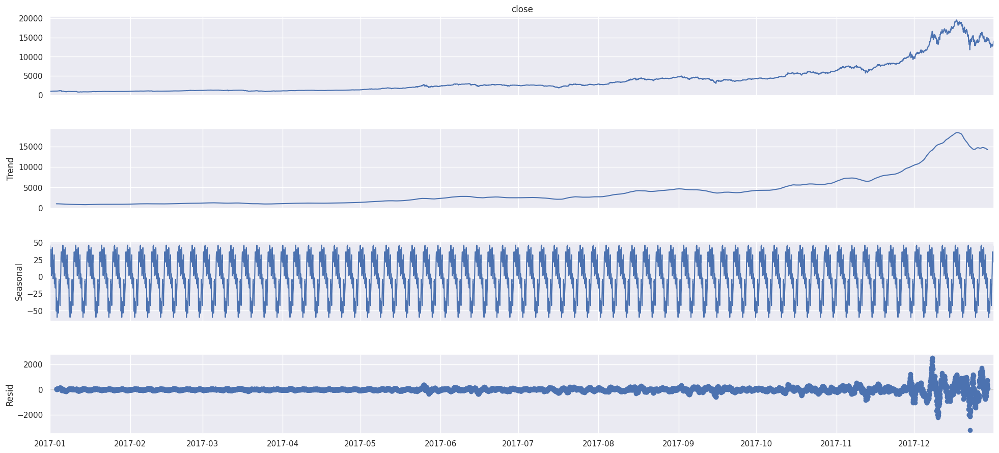

In [18]:
# Возьмём период данных в 1 день
result = seasonal_decompose(df.set_index("date").resample("H").mean()["close"], model="additive", period=120)

fig = result.plot()
fig.set_size_inches((23, 10))
plt.show()

Создадим визуализации выборок данных с которыми мы будем работать. Так-же визуализируем движущееся среднее на для 500 точек

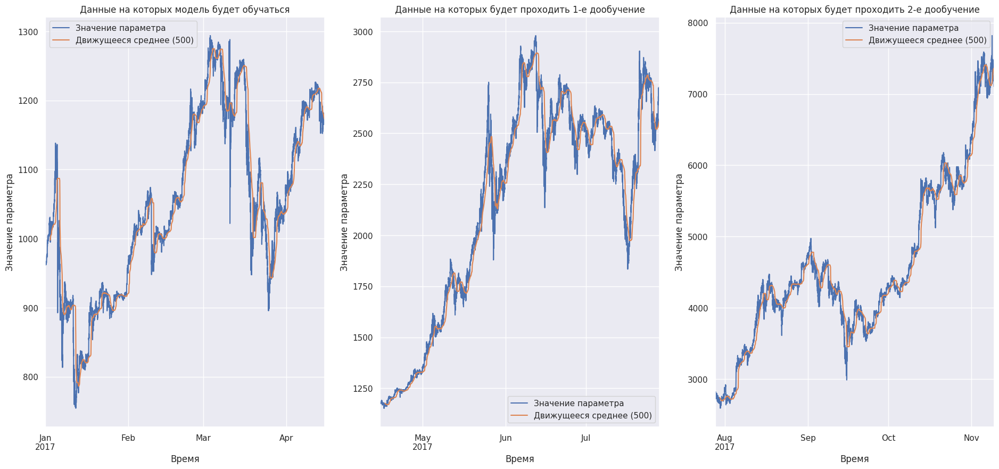

In [19]:
fig, ax = plt.subplots(1, 3, figsize=(23, 10))

df.set_index("date").iloc[0:30000]["close"].plot(ax=ax[0])
df.set_index("date").iloc[0:30000]["close"].rolling(500).median().plot(ax=ax[0])
ax[0].set_title("Данные на которых модель будет обучаться")
ax[0].set_xlabel("Время")
ax[0].set_ylabel("Значение параметра")
ax[0].legend(["Значение параметра", "Движущееся среднее (500)"])

df.set_index("date").iloc[30000:60000]["close"].plot(ax=ax[1])
df.set_index("date").iloc[30000:60000]["close"].rolling(500).median().plot(ax=ax[1])
ax[1].set_title("Данные на которых будет проходить 1-e дообучение")
ax[1].set_xlabel("Время")
ax[1].set_ylabel("Значение параметра")
ax[1].legend(["Значение параметра", "Движущееся среднее (500)"])

df.set_index("date").iloc[60000:90000]["close"].plot(ax=ax[2])
df.set_index("date").iloc[60000:90000]["close"].rolling(500).median().plot(ax=ax[2])
ax[2].set_title("Данные на которых будет проходить 2-e дообучение")
ax[2].set_xlabel("Время")
ax[2].set_ylabel("Значение параметра")
ax[2].legend(["Значение параметра", "Движущееся среднее (500)"])

plt.show()

## Вывод

В результате анализа стало понятно, что данные которые мы взяли для анализа достаточно чистые. Но эти данные не имеют чётко выраженной сезонности или периодичности, для этих данных она является плавающей (по этому для этих данных достаточно большая ошибка при разложении их на тренд и сезонную компоненты). Прогнозировать дакие данные достаточно затруднительно. По этому для прогноза будет использоваться рекурентная нейронная сеть. Модель будет иметь один скрытый слой (для скорости обучения), а в качестве рекурентного слоя будет выступать GRU, а не LSTM из-за его меньших вычислительных затрат. Мы будем создавать унивариативный прогноз (по одной переменной) с помощью модели, параметр который мы будем подавать в модель и прогнозировать - цена Биткойна в USD закрытия торгов (close)

# Создание датасетов

Создадим константы, которые представляют из себя промежуток входных данных для создания прогноза и промежуток который будет спрогнозирован моделью

In [20]:
DATA_SIZE_FOR_FORECAST = 300
DATA_SIZE_TO_FORECAST = 30

## Масштабирование данных

Подходящим скейлером для прогнозирования будет унивариативный StandardScaler

In [21]:
scaler = StandardScaler().fit(df["close"].to_frame())
scaler

StandardScaler()

Преобразуем данные

In [22]:
df_scaled = scaler.transform(df["close"].to_frame())
df_scaled = pd.DataFrame({"close": df_scaled.reshape(-1)})
df_scaled

,close
0,-0.757485
1,-0.757437
2,-0.757591
3,-0.757638
4,-0.757625
...,...
105115,2.548118
105116,2.539532
105117,2.534555
105118,2.524576


Визуализация изначальных и масштабированных данных

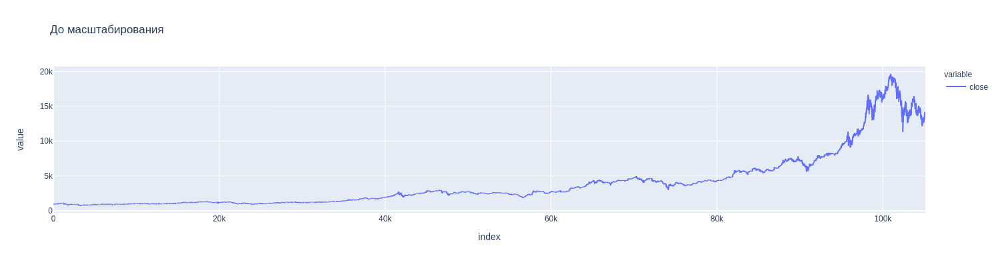

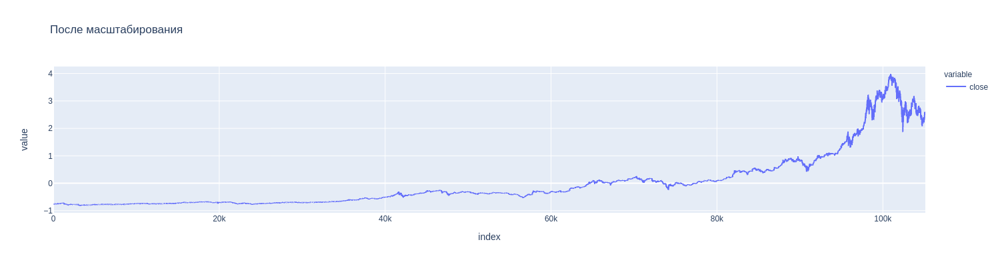

In [338]:
fig_1 = px.line(df["close"], title='До масштабирования')
fig_1.update_layout(
  autosize=False,
  width=1500,
  height=400,
)

fig_2 = px.line(df_scaled["close"], title='После масштабирования')
fig_2.update_layout(
  autosize=False,
  width=1500,
  height=400,
)

display(Image(PLOTLY_SCOPE.transform(fig_1, format="png", scale=1)))
display(Image(PLOTLY_SCOPE.transform(fig_2, format="png", scale=1)))

In [335]:
px.line(df["close"], title='До масштабирования').show()
px.line(df_scaled["close"], title='После масштабирования').show()

## Создание окон данных для работы с ними

Создаём массив окон для дальнейших вычислений и созданий выборок для обучения и тестирования моделей

In [156]:
windows_1 = df_scaled.iloc[:30000]["close"]
windows_2 = df_scaled.iloc[30000:60000]["close"]
windows_3 = df_scaled.iloc[60000:90000]["close"]

In [157]:
# Создаём массив окон для входных данных
windows_1_input = sliding_window_view(
    df_scaled.iloc[:30000]["close"].to_frame().copy(),
    window_shape=(DATA_SIZE_FOR_FORECAST, 1)
)
# Убираем ненужную размерность 1, размерность до обработки: (x, 1, y, 1)
windows_1_input = np.squeeze(windows_1_input)
# Возвращаем размерность b (x, y, b), которая = 1
windows_1_input = np.expand_dims(windows_1_input, axis=2)
# ОТбираем только те окна, которые нам нужны
windows_1_input = windows_1_input[:-DATA_SIZE_TO_FORECAST]

# Создаём массив окон для входных данных
windows_1_output = sliding_window_view(
    df_scaled.iloc[:30000]["close"].to_frame().copy(),
    window_shape=(DATA_SIZE_TO_FORECAST, 1)
)
# Убираем ненужную размерность 1, размерность до обработки: (x, 1, y, 1)
windows_1_output = np.squeeze(windows_1_output)
# Возвращаем размерность b (x, y, b), которая = 1
windows_1_output = np.expand_dims(windows_1_output, axis=2)
# ОТбираем только те окна, которые нам нужны
windows_1_output = windows_1_output[DATA_SIZE_FOR_FORECAST:]

windows_1_input.shape, windows_1_output.shape

((29671, 300, 1), (29671, 30, 1))

In [158]:
# Создаём массив окон для входных данных
windows_2_input = sliding_window_view(
    df_scaled.iloc[30000:60000]["close"].to_frame().copy(),
    window_shape=(DATA_SIZE_FOR_FORECAST, 1)
)
# Убираем ненужную размерность 1, размерность до обработки: (x, 1, y, 1)
windows_2_input = np.squeeze(windows_2_input)
# Возвращаем размерность b (x, y, b), которая = 1
windows_2_input = np.expand_dims(windows_2_input, axis=2)
# ОТбираем только те окна, которые нам нужны
windows_2_input = windows_2_input[:-DATA_SIZE_TO_FORECAST]

# Создаём массив окон для входных данных
windows_2_output = sliding_window_view(
    df_scaled.iloc[30000:60000]["close"].to_frame().copy(),
    window_shape=(DATA_SIZE_TO_FORECAST, 1)
)
# Убираем ненужную размерность 1, размерность до обработки: (x, 1, y, 1)
windows_2_output = np.squeeze(windows_2_output)
# Возвращаем размерность b (x, y, b), которая = 1
windows_2_output = np.expand_dims(windows_2_output, axis=2)
# ОТбираем только те окна, которые нам нужны
windows_2_output = windows_2_output[DATA_SIZE_FOR_FORECAST:]

windows_2_input.shape, windows_2_output.shape

((29671, 300, 1), (29671, 30, 1))

In [159]:
# Создаём массив окон для входных данных
windows_3_input = sliding_window_view(
    df_scaled.iloc[60000:90000]["close"].to_frame().copy(),
    window_shape=(DATA_SIZE_FOR_FORECAST, 1)
)
# Убираем ненужную размерность 1, размерность до обработки: (x, 1, y, 1)
windows_3_input = np.squeeze(windows_3_input)
# Возвращаем размерность b (x, y, b), которая = 1
windows_3_input = np.expand_dims(windows_3_input, axis=2)
# ОТбираем только те окна, которые нам нужны
windows_3_input = windows_3_input[:-DATA_SIZE_TO_FORECAST]

# Создаём массив окон для входных данных
windows_3_output = sliding_window_view(
    df_scaled.iloc[60000:90000]["close"].to_frame().copy(),
    window_shape=(DATA_SIZE_TO_FORECAST, 1)
)
# Убираем ненужную размерность 1, размерность до обработки: (x, 1, y, 1)
windows_3_output = np.squeeze(windows_3_output)
# Возвращаем размерность b (x, y, b), которая = 1
windows_3_output = np.expand_dims(windows_3_output, axis=2)
# ОТбираем только те окна, которые нам нужны
windows_3_output = windows_3_output[DATA_SIZE_FOR_FORECAST:]

windows_3_input.shape, windows_3_output.shape

((29671, 300, 1), (29671, 30, 1))

## Создание выборок

Создаём обучающие и тестовые выборки. Валидационные выборки будут создаваться уже внутри модели

In [160]:
x_1_train, x_1_test, y_1_train, y_1_test = train_test_split(windows_1_input, windows_1_output)

x_1_train.shape, x_1_test.shape, y_1_train.shape, y_1_test.shape

((22253, 300, 1), (7418, 300, 1), (22253, 30, 1), (7418, 30, 1))

In [161]:
x_2_train, x_2_test, y_2_train, y_2_test = train_test_split(windows_2_input, windows_2_output)

x_2_train.shape, x_2_test.shape, y_2_train.shape, y_2_test.shape

((22253, 300, 1), (7418, 300, 1), (22253, 30, 1), (7418, 30, 1))

In [162]:
x_3_train, x_3_test, y_3_train, y_3_test = train_test_split(windows_3_input, windows_3_output)

x_3_train.shape, x_3_test.shape, y_3_train.shape, y_3_test.shape

((22253, 300, 1), (7418, 300, 1), (22253, 30, 1), (7418, 30, 1))

# Создание, обучение, тестирование и сохранение модели

## Создание модели

In [163]:
# Создание модели
model = keras.Sequential()
model.add(keras.layers.GRU(256, input_shape=(DATA_SIZE_FOR_FORECAST, 1), name='input_layer'))
model.add(keras.layers.Dense(DATA_SIZE_TO_FORECAST, name='output_layer'))

# Создание оптимизатора и функции потери
optimizer = keras.optimizers.Adam(learning_rate=0.01)
loss = keras.losses.MeanSquaredError()

with tf.device(device):
  # Компиляция модели
  model.compile(optimizer=optimizer, loss=loss)


# Вывод структуры модели
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (GRU)           (None, 256)               198912    
                                                                 
 output_layer (Dense)        (None, 30)                7710      
                                                                 
Total params: 206622 (807.12 KB)
Trainable params: 206622 (807.12 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


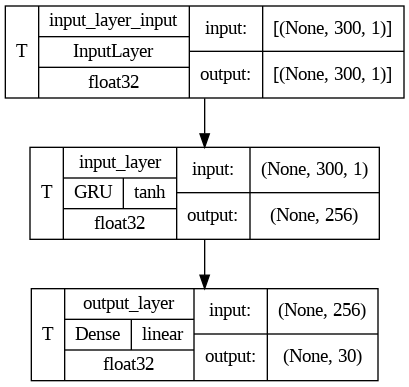

In [164]:
keras.utils.plot_model(model, show_shapes=True,
                       show_layer_activations=True,
                       show_trainable=True, show_dtype=True)

## Обучение модели

In [165]:
with tf.device(device):
  hist = model.fit(x=x_1_train, y=y_1_train,
                   #batch_size=16, Батч ухудшил прогноз
                   validation_split=0.3,
                   epochs=20)

Epoch 1/20
487/487 [==============================] - 11s 19ms/step - loss: 0.0254 - val_loss: 3.7166e-05
Epoch 2/20
487/487 [==============================] - 9s 18ms/step - loss: 4.1542e-05 - val_loss: 1.1529e-05
Epoch 3/20
487/487 [==============================] - 8s 17ms/step - loss: 3.4154e-05 - val_loss: 2.0683e-05
Epoch 4/20
487/487 [==============================] - 8s 17ms/step - loss: 3.3282e-05 - val_loss: 4.8543e-05
Epoch 5/20
487/487 [==============================] - 9s 17ms/step - loss: 3.3022e-05 - val_loss: 3.3154e-05
Epoch 6/20
487/487 [==============================] - 10s 20ms/step - loss: 3.5723e-05 - val_loss: 1.6359e-05
Epoch 7/20
487/487 [==============================] - 11s 22ms/step - loss: 3.1664e-05 - val_loss: 1.3608e-05
Epoch 8/20
487/487 [==============================] - 11s 22ms/step - loss: 3.3530e-05 - val_loss: 5.3184e-05
Epoch 9/20
487/487 [==============================] - 10s 21ms/step - loss: 4.5542e-05 - val_loss: 3.2033e-05
Epoch 10/20
487/48

<Axes: >

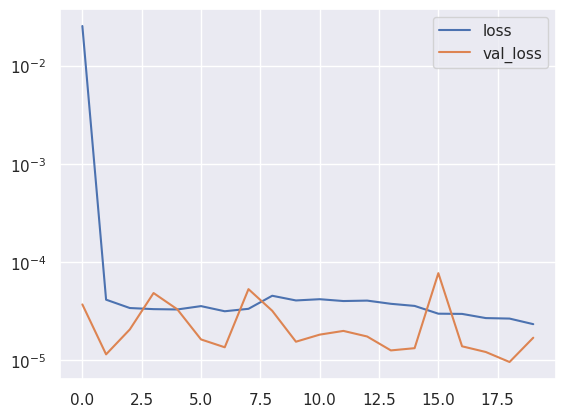

In [166]:
pd.DataFrame(hist.history).plot(logy=True)

## Тестирование модели

Сохраняем результаты тестирования модели на тестовых выборках, чтобы в дальнейшем произвести их анализ

In [167]:
mse_learned_1_test = model.evaluate(x_1_test, y_1_test, verbose=0)
mse_learned_2_test = model.evaluate(x_2_test, y_2_test, verbose=0)
mse_learned_3_test = model.evaluate(x_3_test, y_3_test, verbose=0)

print("Данные на которых было произведено обучение: ", mse_learned_1_test)
print("Данные для 1-го дообучения: ", mse_learned_2_test)
print("Данные для 2-го дообучения: ", mse_learned_3_test)

Данные на которых было произведено обучение:  1.855332448030822e-05
Данные для 1-го дообучения:  0.00032370901317335665
Данные для 2-го дообучения:  0.2237478494644165


In [168]:
with tf.device(device):
  result_1 = model.predict(windows_1_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_2 = model.predict(windows_2_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_3 = model.predict(windows_3_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)

31/31 [==============================] - 0s 6ms/step


In [169]:
result_template = np.empty(30000)
result_template[:] = np.NaN
result_template

array([nan, nan, nan, ..., nan, nan, nan])

In [170]:
result_template[DATA_SIZE_FOR_FORECAST:] = result_1
result_1 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_2
result_2 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_3
result_3 = result_template.copy()

In [171]:
skleyka_dots_1_x = [300 + i*30 for i in range(windows_1_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_1_y = df_scaled.iloc[:30000].iloc[skleyka_dots_1_x]

skleyka_dots_2_x = [300 + i*30 for i in range(windows_2_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_2_y = df_scaled.iloc[30000:60000].iloc[skleyka_dots_2_x]

skleyka_dots_3_x = [300 + i*30 for i in range(windows_3_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_3_y = df_scaled.iloc[60000:90000].iloc[skleyka_dots_3_x]

Склейка результатов предсказания с шагом DATA_SIZE_TO_FORECAST

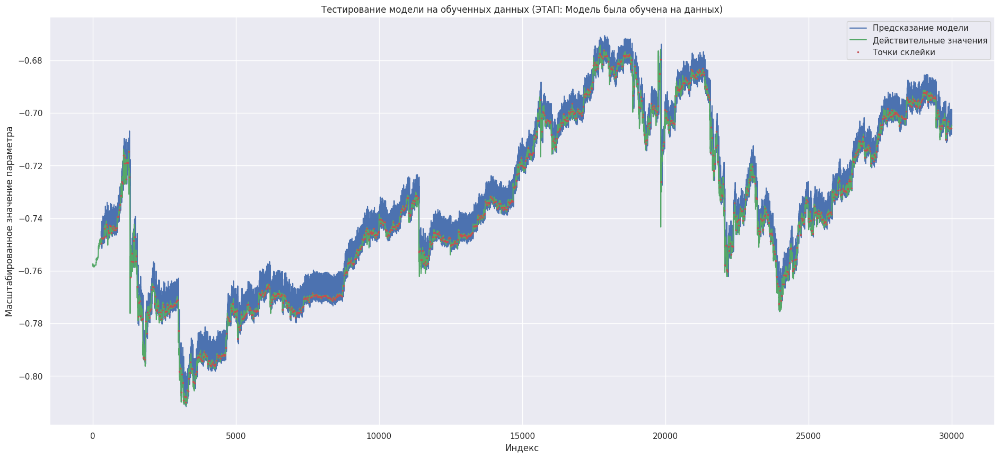

In [172]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_1)
ax.plot(df_scaled.iloc[:30000]["close"].values, c="g")
ax.plot(skleyka_dots_1_x, skleyka_dots_1_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на обученных данных (ЭТАП: Модель была обучена на данных)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

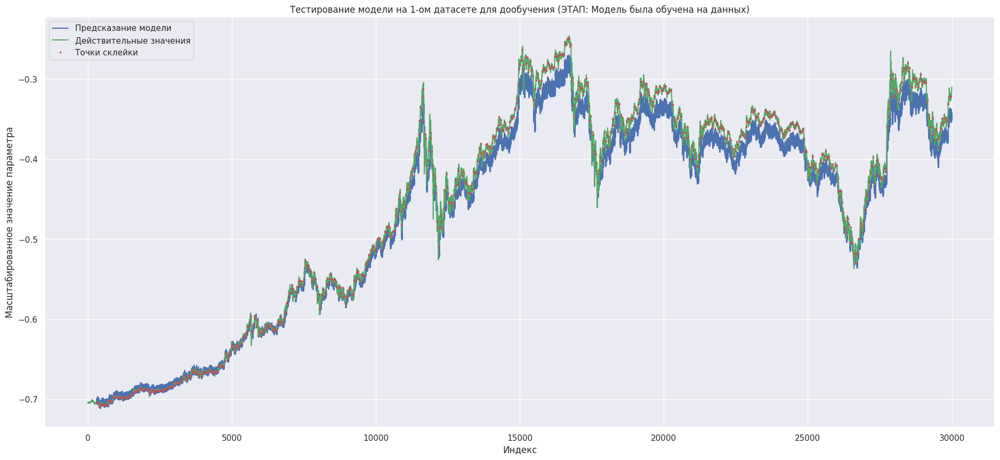

In [173]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_2)
ax.plot(df_scaled.iloc[30000:60000]["close"].values, c="g")
ax.plot(skleyka_dots_2_x, skleyka_dots_2_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 1-ом датасете для дообучения (ЭТАП: Модель была обучена на данных)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

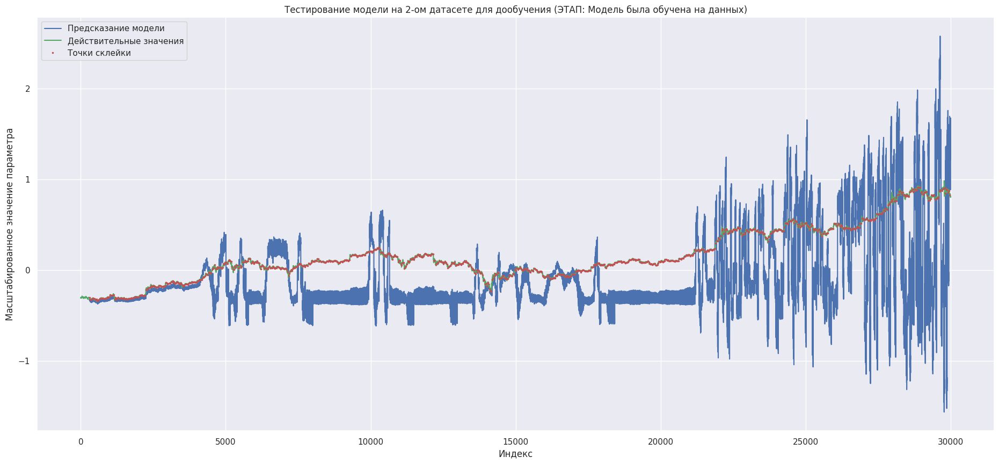

In [174]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_3)
ax.plot(df_scaled.iloc[60000:90000]["close"].values, c="g")
ax.plot(skleyka_dots_3_x, skleyka_dots_3_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 2-ом датасете для дообучения (ЭТАП: Модель была обучена на данных)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

## Сохранение модели

In [175]:
model.save("model.keras")

# Подготовка функций потерь

## L2

Ридж регуляризация или регуляризация Тихонова. Эта штрафная функция является суммой квадратов весов модели, умноженных на гиперпараметр регуляризации. Это означает, что L2 регуляризация штрафует большие значения весов, заставляя их приближаться к нулю, но в отличие от L1 регуляризации не зануляет их полностью. Вместо этого L2 регуляризация штрафует большие значения весов более гладко и непрерывно, что позволяет более уверенно управлять компромиссом между точностью и сложностью модели.

Кроме того, L2 регуляризация может помочь в предотвращении переобучения и улучшении обобщающей способности модели, а также в уменьшении влияния шума в данных на модель.

В общем виде формула выглядит так (если модель обученна на данных $A$ и мы дообучаем её на данных $B$):

$L = L_{B} + \frac{\lambda}{2} \sum_{i}{(w_{i} - w^{*}_{B,i})^2}$

*Где $L_{B}$ - ошибка при обучении на наборе $B$ без закрепления весов, $\lambda$ - коэфицинет важности регуляризации (чем меньше коэф. тем меньше мы будем оглядываться на сложность модели), $w_{i}$ - новые веса после цикла обучения, $w^{*}_{B,i}$ - веса нейронной сети после обучения на наборе $B$*

P.s. В нашем случае $L_{B}$ - это MSE

P.s.s. В зависимости от цикла дообучения формула не меняется

In [176]:
def custom_loss_with_l2_reg(lambda_value):
  def loss(y_true, y_pred):
      # Вычисление квадрат значений разности между y_true и y_pred
      diff = K.square(y_true - y_pred)
      # Вычисление суммы всех значений diff
      l2_loss = K.sum(diff)
      # Расчитываем финальную потерю: MSE + L2
      result = keras.losses.mean_squared_error(y_true, y_pred) + lambda_value * l2_loss

      return result
  return loss

## EWC-F

Приношу большие благодарности db434 за скрипт: https://github.com/db434/EWC

Ниже описанный метод - модернизация метода из сылки, так же с болшим кол-вом коментариев


Данный метод является серьёзной модификацой L2 регуляризации. В этом методе мы начинаем учитывать важность весов, которые использовались при обучении прошлых задачь

Для оценки важности используемых весов в данной модификации используется Информационная матрица Фишера. Данная матрица расчитывается единожды для данных расчитанных в прошлом. Т.е. если модель уже обученна на данных $A$, а мы хотим обучить модель на данных $B$, то для оценки важности весов мы будем использовать вектор $Z_{A,i}$. Если наша модель уже обученна на данных $A$ и $B$, а мы хотим обучить модель на данных $C$, то мы будем использовать скалярную сумму векторов информационной матрицы Фишера $Z_{A,i} + Z_{B,i}$. НО, если у нас нет $Z_{A,i}$ в случае обучении модели на данных $C$, а модель обучена на данных $A$ и $B$, то дообучение не будет возможности произвести

В общем виде формула выглядит так (если модель обученна на данных $A$ и мы дообучаем её на данных $B$):

$L = L_{B} + \frac{\lambda}{2} \sum_{i}{F_{A,i}(w_{i} - w^{*}_{A,i})^2}$

*Где $L_{B}$ - ошибка при обучении на наборе $B$ без закрепления весов, $\lambda$ - коэфицинет важности прошлых данных (чем меньше коэф. тем меньше мы будем оглядываться на прошлый опыт модели), $F_{A,i}$ - диагональ информационной матрицы Фишера для данных $A$, $w_{i}$ - новые веса после цикла обучения, $w^{*}_{A,i}$ - веса нейронной сети после обучения на наборе $A$*

И в случае если модель обученна на данных $A$ и $B$, а мы дообучаем её на данных $C$:

$L = L_{C} + \frac{\lambda}{2} \sum_{i}{(F_{A,i} + F_{B,i})(w_{i} - w^{*}_{B,i})^2}$

*Где $L_{C}$ - ошибка при обучении на наборе $C$ без закрепления весов, $\lambda$ - коэфицинет важности прошлых данных (чем меньше коэф. тем меньше мы будем оглядываться на прошлый опыт модели), $F_{A,i}$ - диагональ информационной матрицы Фишера для данных $A$, $F_{B,i}$ - диагональ информационной матрицы Фишера для данных $B$, $w_{i}$ - новые веса после цикла обучения, $w^{*}_{B,i}$ - веса нейронной сети после обучения на наборе $B$*

P.s. В нашем случае $L_{B}$ и $L_{C}$ - это MSE или другая функция потерь

P.s.s. Данную функцию потерь можно применять к задачам классификации, регрессии и другим задачам

In [177]:
# Функция для создания функции потери
def ewc_f_loss(lam, model, tf_loss="mse", data_input=None, samples_ratio=None,
               fisher_diagonals=None):
    """
    Сгенерировать функцию потерь, которая будет штрафовать за отклонение от
    текущего состояния состояния. Предполагается, что модель достигает
    хорошей точности на `data_input`, и мы хотим сохранить это поведение.

    Штраф масштабируется в зависимости от того, насколько важен каждый вес для
    данного набора данных для данного набора данных, а `lam` (лямбда)
    применяется одинаково ко всем весам.

    :param lam: Важность данной функции потерь по сравнению с другими.
    :param model: Модель, которая была оптимизированна под датасет.
    :param tf_loss: Дополнительная функция потерь для расчётов
    :param data_input: NumPy массив.
    :param samples: Соотнешение данных которое будет взято для вычислений
                    (в некоторых случаях диагонали могут стать равными NAN,
                    по этому берётся токлько часть выборки).
    :param fisher_diagonals: Заранее расчитанная диагонали матриц Фишера
                             (если у вас их несколько, то требуется сложить их).
    :return: Функция потреь.
    """
    # Создание функций потерь, одну из которых мы выберем для
    # параллельного расчёта вместе с EWC
    def mse(y_true, y_pred):
        return K.mean(K.square(y_pred - y_true))

    def rmse(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))

    def mae(y_true, y_pred):
        return K.sqrt(K.mean(K.abs(y_pred - y_true)))

    def msle(y_true, y_pred):
        return keras.losses.MeanSquaredLogarithmicError(y_true, y_pred)

    def coeff_determination(y_true, y_pred):
        SS_res =  K.sum(K.square(y_true - y_pred))
        SS_tot = K.sum(K.square( y_true - K.mean(y_true)))
        return 1 - SS_res/(SS_tot + K.epsilon())

    if tf_loss == "mse":
      tf_loss = mse
    elif tf_loss == "rmse":
      tf_loss = rmse
    elif tf_loss == "mae":
      tf_loss = mae
    elif tf_loss == "msle":
      tf_loss = msle
    elif tf_loss == "cd":
      tf_loss = coeff_determination

    optimal_weights = deepcopy(model.trainable_weights)
    if fisher_diagonals is None:
      if samples_ratio is None or data_input is None:
        raise Exception("Данные для расчёта матрицы Фишера не далжна быть None")
      fisher_diagonals = calculate_fisher_diagonals(model, data_input, samples_ratio)

    # Создаём функцию потерь
    def loss_fn(y_true, y_pred, new_model=model,
                fisher_diagonals=fisher_diagonals):
        # Мы расчитываем:
        # loss + sum [(lambda / 2) * F * (current weights - optimal weights)^2]
        loss = 0
        current = new_model.trainable_weights
        for f, c, o in zip(fisher_diagonals, current, optimal_weights):
            # Выбранная ранее функция потерь
            loss += tf_loss(y_true, y_pred)
            # EWC-F
            loss += tf.reduce_sum(f * ((c - o) ** 2)) * (lam / 2)

        return loss

    return loss_fn

In [178]:
def calculate_fisher_diagonals(model, data_input, samples_ratio):
    """
    Данная функция расчитывает диагонали матриц Фишера, которые представляют собой
    важность каждого веса в модели. Они апроксимируется с помощью дисперсии
    градиента каджого веса для некоторой подвыборки из общего набора данных.

    :param model: Модель для которой будет расчитываться матрица Фишера.
    :param data_input: Входной набор данных для модели, на котором была обучена
                       модель, но который не будет использоваться в будущем.
    :param samples_ratio: Соотнешение данных которое будет взято для
                          вычислений.
    :return: Главные диагонали матриц Фишера, пересформированные, чтобы
             подходить по размерностям с весами из `model.trainable_weights`.
    """

    weights = model.trainable_weights
    variance = [tf.zeros_like(tensor) for tensor in weights]
    sampels = 0

    for sample_idx in tqdm.tqdm(np.arange(0, data_input.shape[0], 1 // samples_ratio, dtype=int).tolist()):
        # Отбираем нужный нам участок данных (по sample_idx)
        sampels += 1
        data = data_input[sample_idx]

        # Возвращаем утерянную размерность
        data = tf.expand_dims(data, axis=0)

        # Собираем градиенты
        with tf.GradientTape() as tape:
            output = model(data)
            log_likelihood = tf.math.log(output)

        gradients = tape.gradient(log_likelihood, weights)

        # Если модель сходится, то можно считать, что текущие веса являются
        # средним значением, а каждый наблюдаемый градиент - отклонением.
        # Дисперсия - это среднее квадратное этого отклонения
        variance = [var + (grad ** 2) for var, grad in zip(variance, gradients)]

    fisher_diagonals = [tensor / sampels for tensor in variance]
    return fisher_diagonals

# Про протокол дообучения моделей

В дальнейшем для дообучения моделей будет использоваться RMSprop, а не Adam. RMSprop порой показывает себя лучше, чем Adam в задачах дообучения моделей прогнозирования временных рядов

Дообучение будет состоять из этапов: подготовки, дообучения, тестирования и сохранения результатов. В этапе подготовки будут создавать оптимизаторы и функции потерь, подгружаться модели, а также производится доп. расчёты. В тестировании будет происходить расчёт метрик качества дообученной модели на тестовых данны (метрика для оценки качества: MSE), а так же создания визуализации склейки прогнозов для всех выборок (на которой модель была обучена, для 1-го дообучения и 2-го дообучения)

После произведения всех дообучений будут построены визуализации сравнения работы моделей на тестовых выборках и подведены итоги работы

# Дообучение модели на 1-ом датасете

## Дообучение с использованием L2 регуляризации

### Подготовка к дообучению

In [179]:
model_uplift = keras.models.load_model("model.keras")

In [180]:
new_optimezer = tf.keras.optimizers.RMSprop(learning_rate=0.0005, clipnorm=1.0)
new_loss = custom_loss_with_l2_reg(lambda_value=0.003)

In [181]:
with tf.device(device):
  model_uplift.compile(optimizer=new_optimezer, loss=new_loss)

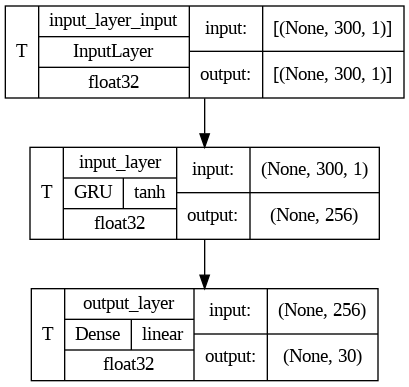

In [182]:
model_uplift.build(input_shape=(None, 180, 6))
keras.utils.plot_model(model_uplift, show_shapes=True,
                       show_layer_activations=True,
                       show_trainable=True, show_dtype=True)

### Дообучение модели

In [183]:
with tf.device(device):
  hist = model_uplift.fit(x=x_2_train, y=y_2_train,
                          #batch_size=16, Батч ухудшил результат дообучения
                          validation_split=0.3,
                          epochs=3)

Epoch 1/3
487/487 [==============================] - 11s 19ms/step - loss: 2.0188e-04 - val_loss: 2.0861e-04
Epoch 2/3
487/487 [==============================] - 10s 20ms/step - loss: 1.9531e-04 - val_loss: 1.8083e-04
Epoch 3/3
487/487 [==============================] - 10s 21ms/step - loss: 1.9498e-04 - val_loss: 1.9034e-04


<Axes: >

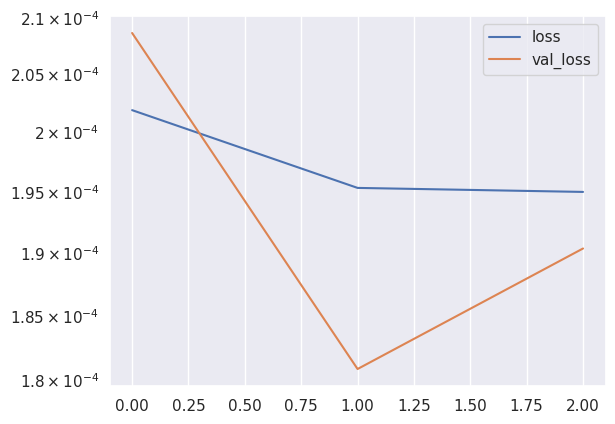

In [184]:
pd.DataFrame(hist.history).plot(logy=True)

### Тестирование модели

Сохраняем результаты тестирования модели на тестовых выборках, чтобы в дальнейшем произвести их анализ

In [185]:
mse_l2_first_1_test = model_uplift.evaluate(x_1_test, y_1_test, verbose=0)
mse_l2_first_2_test = model_uplift.evaluate(x_2_test, y_2_test, verbose=0)
mse_l2_first_3_test = model_uplift.evaluate(x_3_test, y_3_test, verbose=0)

print("Данные на которых было произведено обучение: ", mse_l2_first_1_test)
print("Данные для 1-го дообучения: ", mse_l2_first_2_test)
print("Данные для 2-го дообучения: ", mse_l2_first_3_test)

Данные на которых было произведено обучение:  0.0001018637340166606
Данные для 1-го дообучения:  0.00021353078773245215
Данные для 2-го дообучения:  0.974342942237854


In [186]:
with tf.device(device):
  result_1 = model_uplift.predict(windows_1_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_2 = model_uplift.predict(windows_2_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_3 = model_uplift.predict(windows_3_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)

31/31 [==============================] - 0s 6ms/step


In [187]:
result_template = np.empty(30000)
result_template[:] = np.NaN
result_template

array([nan, nan, nan, ..., nan, nan, nan])

In [188]:
result_template[DATA_SIZE_FOR_FORECAST:] = result_1
result_1 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_2
result_2 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_3
result_3 = result_template.copy()

In [189]:
skleyka_dots_1_x = [300 + i*30 for i in range(windows_1_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_1_y = df_scaled.iloc[:30000].iloc[skleyka_dots_1_x]

skleyka_dots_2_x = [300 + i*30 for i in range(windows_2_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_2_y = df_scaled.iloc[30000:60000].iloc[skleyka_dots_2_x]

skleyka_dots_3_x = [300 + i*30 for i in range(windows_3_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_3_y = df_scaled.iloc[60000:90000].iloc[skleyka_dots_3_x]

Склейка результатов предсказания с шагом DATA_SIZE_TO_FORECAST

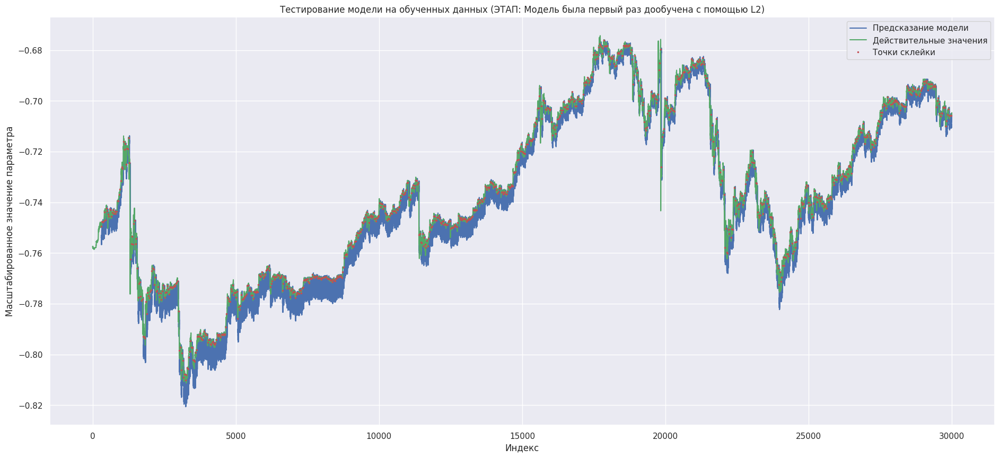

In [190]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_1)
ax.plot(df_scaled.iloc[:30000]["close"].values, c="g")
ax.plot(skleyka_dots_1_x, skleyka_dots_1_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на обученных данных (ЭТАП: Модель была первый раз дообучена с помощью L2)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

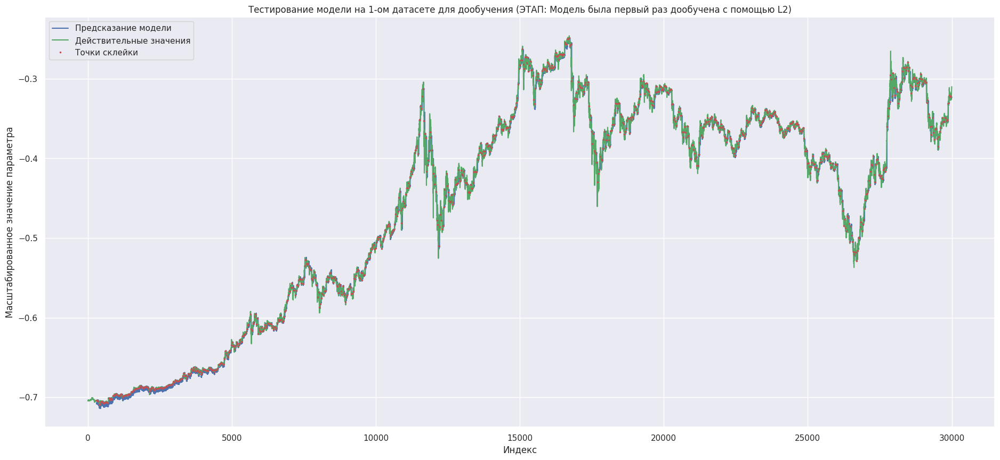

In [191]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_2)
ax.plot(df_scaled.iloc[30000:60000]["close"].values, c="g")
ax.plot(skleyka_dots_2_x, skleyka_dots_2_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 1-ом датасете для дообучения (ЭТАП: Модель была первый раз дообучена с помощью L2)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

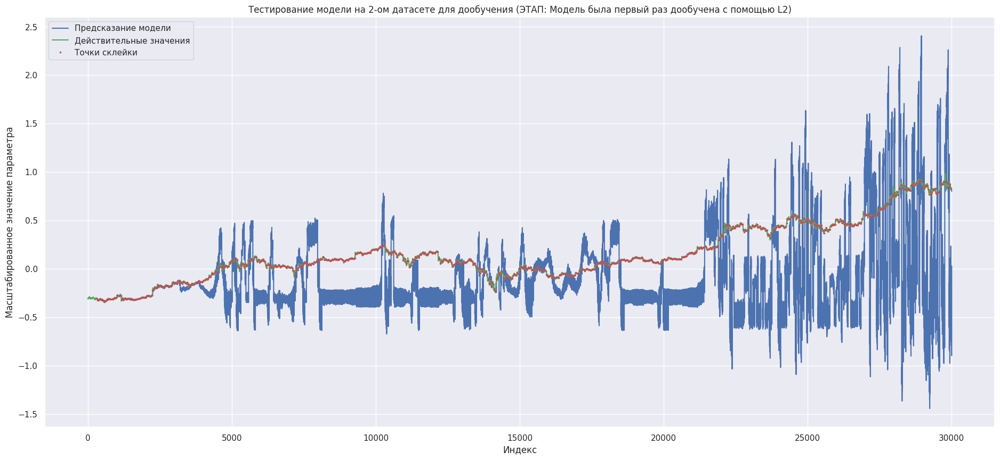

In [192]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_3)
ax.plot(df_scaled.iloc[60000:90000]["close"].values, c="g")
ax.plot(skleyka_dots_3_x, skleyka_dots_3_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 2-ом датасете для дообучения (ЭТАП: Модель была первый раз дообучена с помощью L2)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

### Сохранение модели

In [193]:
model_uplift.save("model_1_l2.keras")

## Дообучение с использованием EWC-F регуляризации

### Подготовка к дообучению

In [213]:
model_uplift = keras.models.load_model("model.keras")

Теперь к основным расчётам у нас добавляется расчёт диагоналей матриц Фишера, которые используются при дообучении моделей с помощью метода EWC-F

In [214]:
fisher_diagonals_1 = calculate_fisher_diagonals(model, x_1_train, 1/10)

100%|██████████| 2473/2473 [00:58<00:00, 42.58it/s]


После чего сохраняем диагонали. Они понадобятся нам в следующем дообучении с помощью EWC-F

In [215]:
fisher_diagonals_1_list = [tensor.numpy().tolist() for tensor in fisher_diagonals_1]
with open("fisher_diagonals_1.json", "w") as file:
  json.dump(fisher_diagonals_1_list, file)
del fisher_diagonals_1_list

In [216]:
new_optimezer = tf.keras.optimizers.RMSprop(learning_rate=0.0005, clipnorm=1.0)
new_loss = ewc_f_loss(lam=0.003, model=model_uplift, tf_loss="mse", fisher_diagonals=fisher_diagonals_1)

In [217]:
with tf.device(device):
  model_uplift.compile(optimizer=new_optimezer, loss=new_loss)

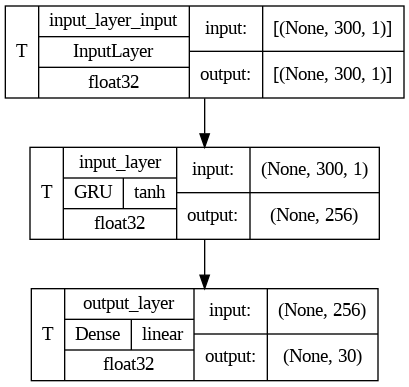

In [218]:
model_uplift.build(input_shape=(None, 180, 6))
keras.utils.plot_model(model_uplift, show_shapes=True,
                       show_layer_activations=True,
                       show_trainable=True, show_dtype=True)

### Дообучение модели

In [219]:
with tf.device(device):
  hist = model_uplift.fit(x=x_2_train, y=y_2_train,
                          #batch_size=16, Батч ухудшил результат дообучения
                          validation_split=0.3,
                          epochs=3)

Epoch 1/3
487/487 [==============================] - 14s 24ms/step - loss: 2.6437e-04 - val_loss: 2.4021e-04
Epoch 2/3
487/487 [==============================] - 10s 21ms/step - loss: 2.5402e-04 - val_loss: 2.3345e-04
Epoch 3/3
487/487 [==============================] - 10s 20ms/step - loss: 2.5421e-04 - val_loss: 2.5780e-04


<Axes: >

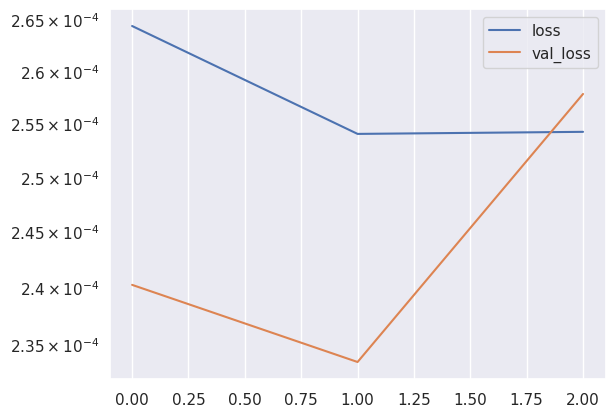

In [220]:
pd.DataFrame(hist.history).plot(logy=True)

### Тестирование модели

Сохраняем результаты тестирования модели на тестовых выборках, чтобы в дальнейшем произвести их анализ

In [221]:
mse_ewc_f_first_1_test = model_uplift.evaluate(x_1_test, y_1_test, verbose=0)
mse_ewc_f_first_2_test = model_uplift.evaluate(x_2_test, y_2_test, verbose=0)
mse_ewc_f_first_3_test = model_uplift.evaluate(x_3_test, y_3_test, verbose=0)

print("Данные на которых было произведено обучение: ", mse_ewc_f_first_1_test)
print("Данные для 1-го дообучения: ", mse_ewc_f_first_2_test)
print("Данные для 2-го дообучения: ", mse_ewc_f_first_3_test)

Данные на которых было произведено обучение:  0.00012831194908358157
Данные для 1-го дообучения:  0.0002892057236749679
Данные для 2-го дообучения:  1.3796120882034302


In [222]:
with tf.device(device):
  result_1 = model_uplift.predict(windows_1_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_2 = model_uplift.predict(windows_2_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_3 = model_uplift.predict(windows_3_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)

31/31 [==============================] - 0s 7ms/step


In [223]:
result_template = np.empty(30000)
result_template[:] = np.NaN
result_template

array([nan, nan, nan, ..., nan, nan, nan])

In [224]:
result_template[DATA_SIZE_FOR_FORECAST:] = result_1
result_1 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_2
result_2 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_3
result_3 = result_template.copy()

In [225]:
skleyka_dots_1_x = [300 + i*30 for i in range(windows_1_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_1_y = df_scaled.iloc[:30000].iloc[skleyka_dots_1_x]

skleyka_dots_2_x = [300 + i*30 for i in range(windows_2_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_2_y = df_scaled.iloc[30000:60000].iloc[skleyka_dots_2_x]

skleyka_dots_3_x = [300 + i*30 for i in range(windows_3_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_3_y = df_scaled.iloc[60000:90000].iloc[skleyka_dots_3_x]

Склейка результатов предсказания с шагом DATA_SIZE_TO_FORECAST

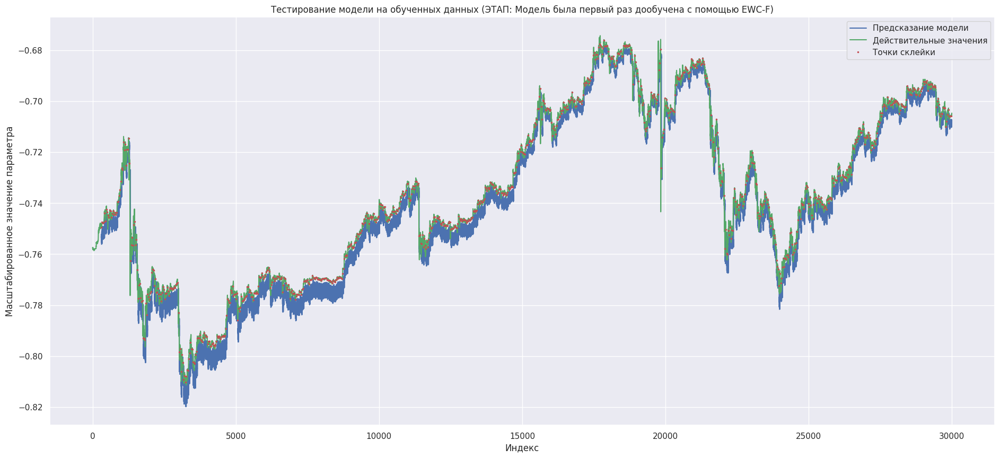

In [226]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_1)
ax.plot(df_scaled.iloc[:30000]["close"].values, c="g")
ax.plot(skleyka_dots_1_x, skleyka_dots_1_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на обученных данных (ЭТАП: Модель была первый раз дообучена с помощью EWC-F)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

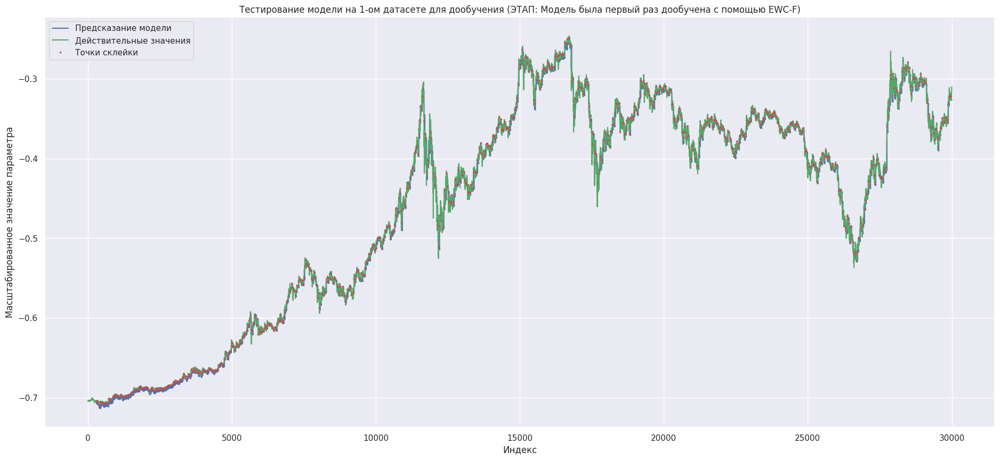

In [227]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_2)
ax.plot(df_scaled.iloc[30000:60000]["close"].values, c="g")
ax.plot(skleyka_dots_2_x, skleyka_dots_2_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 1-ом датасете для дообучения (ЭТАП: Модель была первый раз дообучена с помощью EWC-F)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

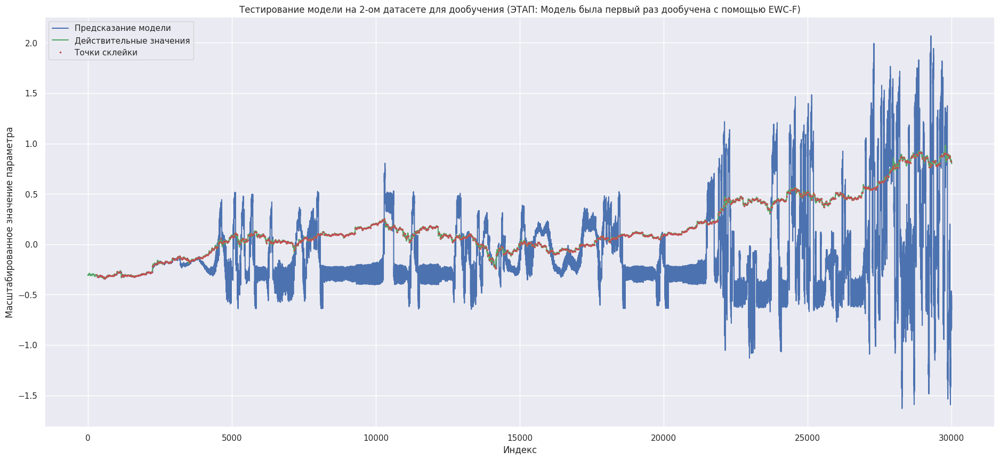

In [228]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_3)
ax.plot(df_scaled.iloc[60000:90000]["close"].values, c="g")
ax.plot(skleyka_dots_3_x, skleyka_dots_3_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 2-ом датасете для дообучения (ЭТАП: Модель была первый раз дообучена с помощью EWC-F)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

### Сохранение модели

In [210]:
model_uplift.save("model_1_ewc_f.keras")

# Дообучение модели на 2-ом датасете

## Дообучение с использованием L2 регуляризации

### Подготовка к дообучению

In [229]:
model_uplift = keras.models.load_model("model_1_l2.keras", compile=False)

In [230]:
new_optimezer = tf.keras.optimizers.RMSprop(learning_rate=0.0005, clipnorm=1.0)
new_loss = custom_loss_with_l2_reg(lambda_value=0.003)

In [231]:
with tf.device(device):
  model_uplift.compile(optimizer=new_optimezer, loss=new_loss)

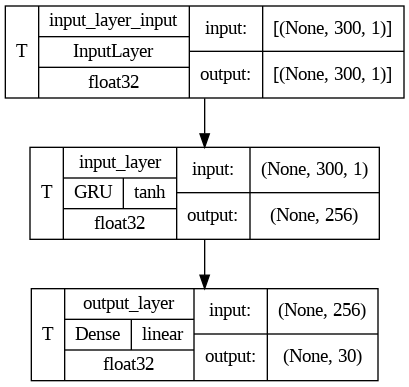

In [232]:
model_uplift.build(input_shape=(None, 180, 6))
keras.utils.plot_model(model_uplift, show_shapes=True,
                       show_layer_activations=True,
                       show_trainable=True, show_dtype=True)

### Дообучение модели

In [233]:
with tf.device(device):
  hist = model_uplift.fit(x=x_3_train, y=y_3_train,
                          #batch_size=16, Батч ухудшил результат дообучения
                          validation_split=0.3,
                          epochs=3)

Epoch 1/3
487/487 [==============================] - 11s 19ms/step - loss: 0.0405 - val_loss: 6.9123e-04
Epoch 2/3
487/487 [==============================] - 9s 18ms/step - loss: 8.6313e-04 - val_loss: 9.6767e-04
Epoch 3/3
487/487 [==============================] - 9s 18ms/step - loss: 7.8514e-04 - val_loss: 6.4459e-04


<Axes: >

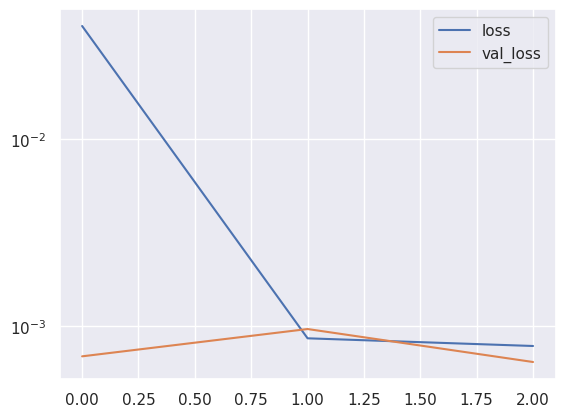

In [234]:
pd.DataFrame(hist.history).plot(logy=True)

### Тестирование модели

Сохраняем результаты тестирования модели на тестовых выборках, чтобы в дальнейшем произвести их анализ

In [235]:
mse_l2_second_1_test = model_uplift.evaluate(x_1_test, y_1_test, verbose=0)
mse_l2_second_2_test = model_uplift.evaluate(x_2_test, y_2_test, verbose=0)
mse_l2_second_3_test = model_uplift.evaluate(x_3_test, y_3_test, verbose=0)

print("Данные на которых было произведено обучение: ", mse_l2_second_1_test)
print("Данные для 1-го дообучения: ", mse_l2_second_2_test)
print("Данные для 2-го дообучения: ", mse_l2_second_3_test)

Данные на которых было произведено обучение:  0.0012965353671461344
Данные для 1-го дообучения:  0.0004955571494065225
Данные для 2-го дообучения:  0.000640333048067987


In [236]:
with tf.device(device):
  result_1 = model_uplift.predict(windows_1_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_2 = model_uplift.predict(windows_2_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_3 = model_uplift.predict(windows_3_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)

31/31 [==============================] - 0s 6ms/step


In [237]:
result_template = np.empty(30000)
result_template[:] = np.NaN
result_template

array([nan, nan, nan, ..., nan, nan, nan])

In [238]:
result_template[DATA_SIZE_FOR_FORECAST:] = result_1
result_1 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_2
result_2 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_3
result_3 = result_template.copy()

In [239]:
skleyka_dots_1_x = [300 + i*30 for i in range(windows_1_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_1_y = df_scaled.iloc[:30000].iloc[skleyka_dots_1_x]

skleyka_dots_2_x = [300 + i*30 for i in range(windows_2_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_2_y = df_scaled.iloc[30000:60000].iloc[skleyka_dots_2_x]

skleyka_dots_3_x = [300 + i*30 for i in range(windows_3_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_3_y = df_scaled.iloc[60000:90000].iloc[skleyka_dots_3_x]

Склейка результатов предсказания с шагом DATA_SIZE_TO_FORECAST

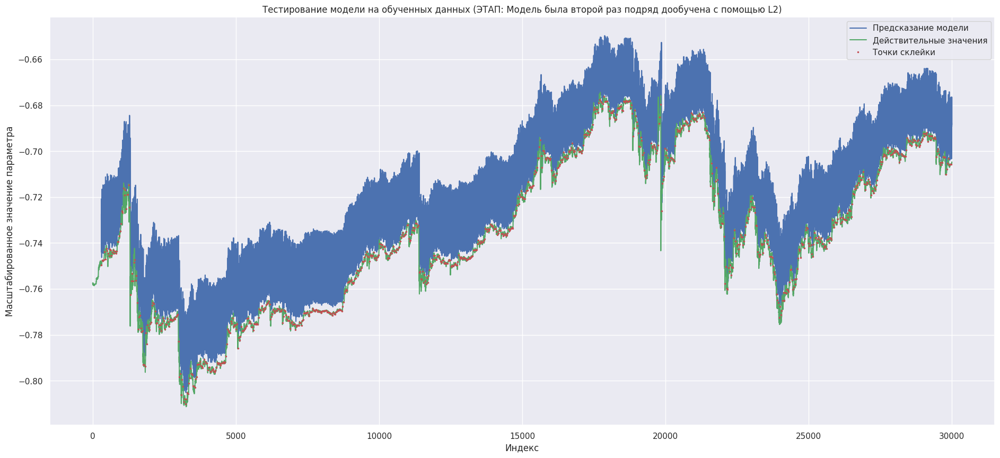

In [240]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_1)
ax.plot(df_scaled.iloc[:30000]["close"].values, c="g")
ax.plot(skleyka_dots_1_x, skleyka_dots_1_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на обученных данных (ЭТАП: Модель была второй раз подряд дообучена с помощью L2)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

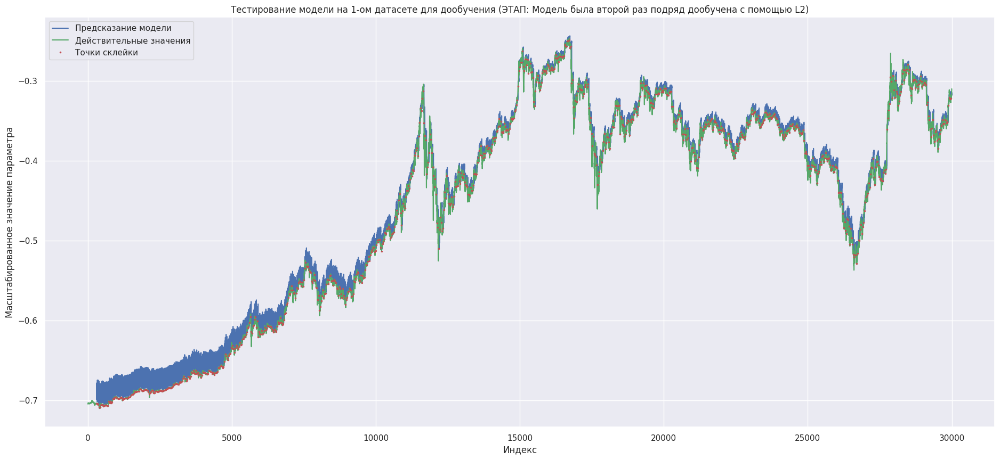

In [241]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_2)
ax.plot(df_scaled.iloc[30000:60000]["close"].values, c="g")
ax.plot(skleyka_dots_2_x, skleyka_dots_2_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 1-ом датасете для дообучения (ЭТАП: Модель была второй раз подряд дообучена с помощью L2)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

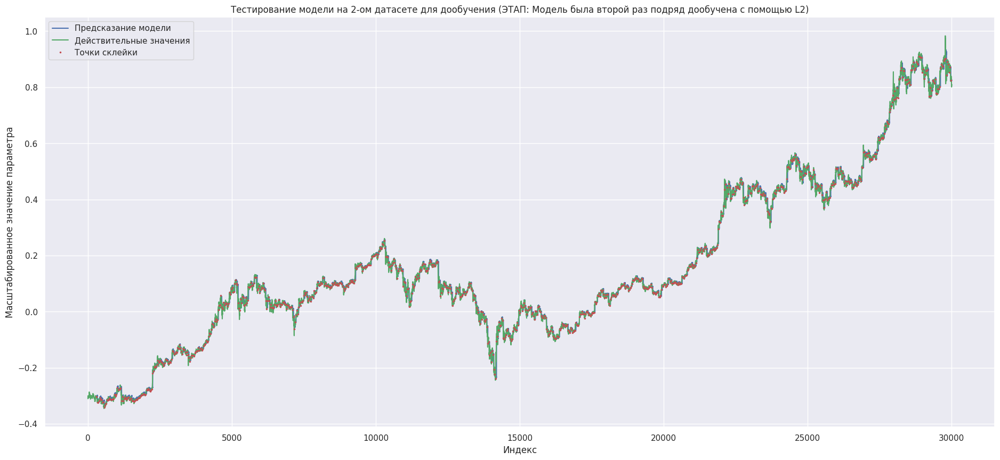

In [242]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_3)
ax.plot(df_scaled.iloc[60000:90000]["close"].values, c="g")
ax.plot(skleyka_dots_3_x, skleyka_dots_3_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 2-ом датасете для дообучения (ЭТАП: Модель была второй раз подряд дообучена с помощью L2)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

### Сохранение модели

In [243]:
model_uplift.save("model_2_l2.keras")

## Дообучение с использованием EWC-F регуляризации

### Подготовка к дообучению

In [298]:
model_uplift = keras.models.load_model("model_1_ewc_f.keras", compile=False)

Расчитываем диагонали матриц фишера

In [266]:
fisher_diagonals_2 = calculate_fisher_diagonals(model, x_2_train, 1/10)

100%|██████████| 2473/2473 [00:44<00:00, 55.92it/s]


После чего скачивает диагонали получившиеся до этого и складываем их вместе

In [267]:
with open("fisher_diagonals_1.json", "r") as file:
  fisher_diagonals_1 = json.load(file)
fisher_diagonals_1 = list(map(tf.convert_to_tensor, fisher_diagonals_1))

In [268]:
fisher_diagonals_2 = fisher_diagonals_2 + fisher_diagonals_1

In [299]:
new_optimezer = tf.keras.optimizers.RMSprop(learning_rate=0.0005, clipnorm=1.0)
new_loss = ewc_f_loss(lam=0.003, model=model_uplift, tf_loss="mse", fisher_diagonals=fisher_diagonals_2)

In [300]:
with tf.device(device):
  model_uplift.compile(optimizer=new_optimezer, loss=new_loss)

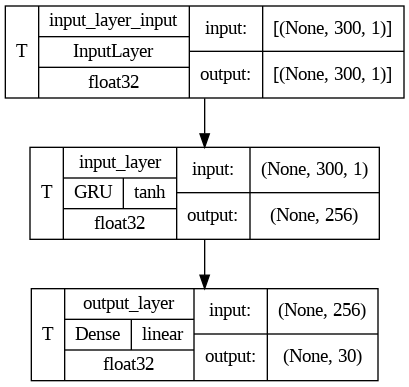

In [301]:
model_uplift.build(input_shape=(None, 180, 6))
keras.utils.plot_model(model_uplift, show_shapes=True,
                       show_layer_activations=True,
                       show_trainable=True, show_dtype=True)

### Дообучение модели

In [302]:
with tf.device(device):
  hist = model_uplift.fit(x=x_3_train, y=y_3_train,
                          #batch_size=16, Батч ухудшил результат дообучения
                          validation_split=0.3,
                          epochs=3)

Epoch 1/3
487/487 [==============================] - 12s 18ms/step - loss: 0.0526 - val_loss: 0.0022
Epoch 2/3
487/487 [==============================] - 10s 20ms/step - loss: 0.0013 - val_loss: 8.7820e-04
Epoch 3/3
487/487 [==============================] - 10s 21ms/step - loss: 0.0011 - val_loss: 9.7884e-04


<Axes: >

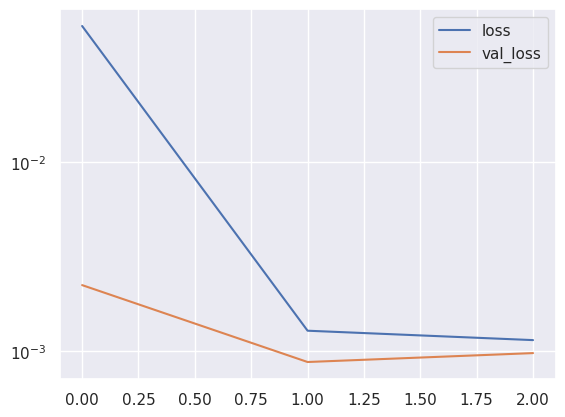

In [303]:
pd.DataFrame(hist.history).plot(logy=True)

### Тестирование модели

Сохраняем результаты тестирования модели на тестовых выборках, чтобы в дальнейшем произвести их анализ

In [304]:
mse_ewc_f_second_1_test = model_uplift.evaluate(x_1_test, y_1_test, verbose=0)
mse_ewc_f_second_2_test = model_uplift.evaluate(x_2_test, y_2_test, verbose=0)
mse_ewc_f_second_3_test = model_uplift.evaluate(x_3_test, y_3_test, verbose=0)

print("Данные на которых было произведено обучение: ", mse_ewc_f_second_1_test)
print("Данные для 1-го дообучения: ", mse_ewc_f_second_2_test)
print("Данные для 2-го дообучения: ", mse_ewc_f_second_3_test)

Данные на которых было произведено обучение:  0.0004388328525237739
Данные для 1-го дообучения:  0.00042655927245505154
Данные для 2-го дообучения:  0.000981232849881053


In [305]:
with tf.device(device):
  result_1 = model_uplift.predict(windows_1_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_2 = model_uplift.predict(windows_2_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)
  result_3 = model_uplift.predict(windows_3_input[::DATA_SIZE_TO_FORECAST]).reshape(-1)

31/31 [==============================] - 0s 6ms/step


In [306]:
result_template = np.empty(30000)
result_template[:] = np.NaN
result_template

array([nan, nan, nan, ..., nan, nan, nan])

In [307]:
result_template[DATA_SIZE_FOR_FORECAST:] = result_1
result_1 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_2
result_2 = result_template.copy()

result_template[DATA_SIZE_FOR_FORECAST:] = result_3
result_3 = result_template.copy()

In [308]:
skleyka_dots_1_x = [300 + i*30 for i in range(windows_1_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_1_y = df_scaled.iloc[:30000].iloc[skleyka_dots_1_x]

skleyka_dots_2_x = [300 + i*30 for i in range(windows_2_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_2_y = df_scaled.iloc[30000:60000].iloc[skleyka_dots_2_x]

skleyka_dots_3_x = [300 + i*30 for i in range(windows_3_input[::DATA_SIZE_TO_FORECAST].shape[0])]
skleyka_dots_3_y = df_scaled.iloc[60000:90000].iloc[skleyka_dots_3_x]

Склейка результатов предсказания с шагом DATA_SIZE_TO_FORECAST

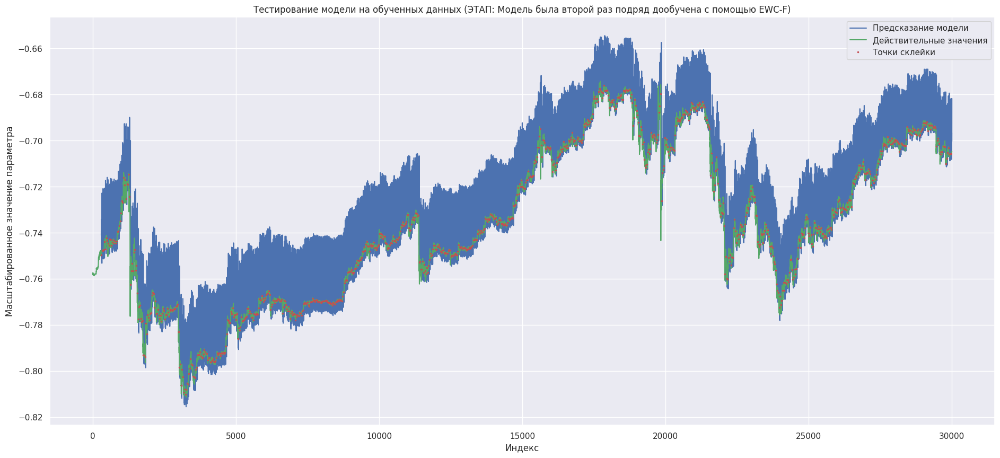

In [309]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_1)
ax.plot(df_scaled.iloc[:30000]["close"].values, c="g")
ax.plot(skleyka_dots_1_x, skleyka_dots_1_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на обученных данных (ЭТАП: Модель была второй раз подряд дообучена с помощью EWC-F)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

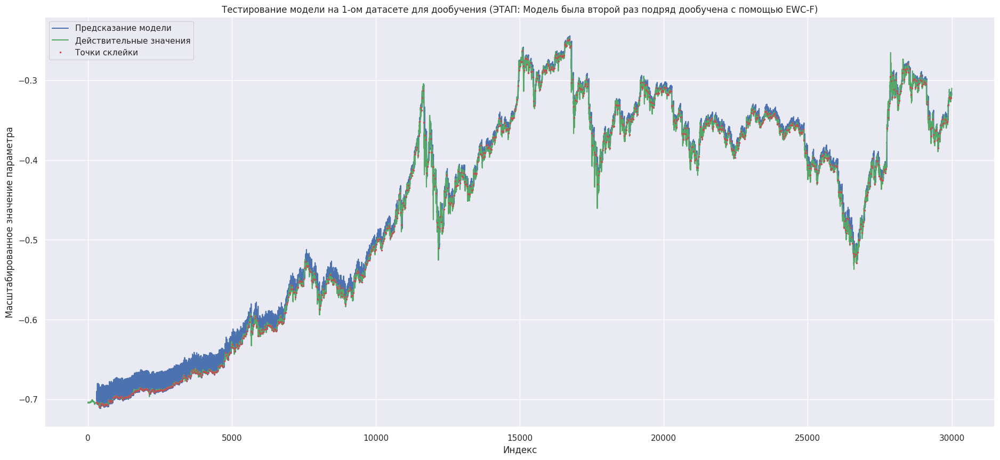

In [310]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_2)
ax.plot(df_scaled.iloc[30000:60000]["close"].values, c="g")
ax.plot(skleyka_dots_2_x, skleyka_dots_2_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 1-ом датасете для дообучения (ЭТАП: Модель была второй раз подряд дообучена с помощью EWC-F)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

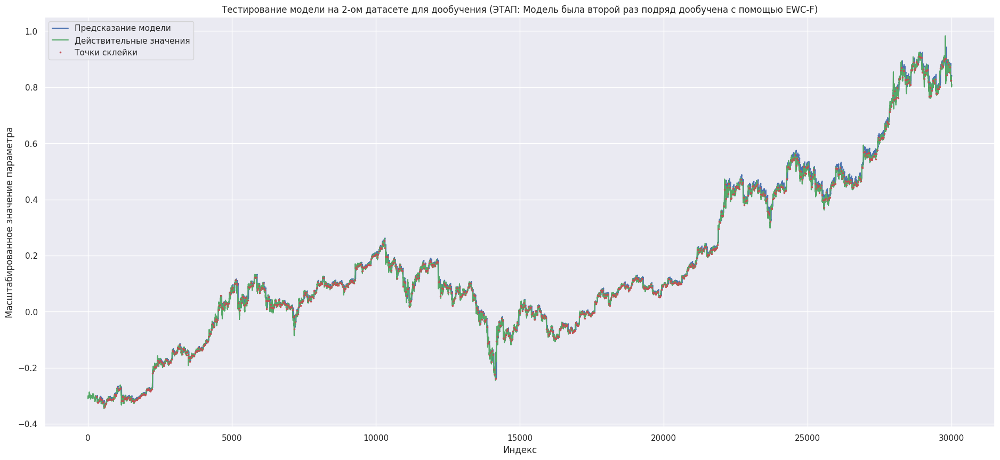

In [311]:
fig, ax = plt.subplots(figsize=(23, 10))
ax.plot(result_3)
ax.plot(df_scaled.iloc[60000:90000]["close"].values, c="g")
ax.plot(skleyka_dots_3_x, skleyka_dots_3_y, c="r", marker='.', ls='none', ms=3)

ax.set_title("Тестирование модели на 2-ом датасете для дообучения (ЭТАП: Модель была второй раз подряд дообучена с помощью EWC-F)")
ax.set_xlabel("Индекс")
ax.set_ylabel("Масштабированное значение параметра")
ax.legend(["Предсказание модели", "Действительные значения", "Точки склейки"])

plt.show()

### Сохранение модели

In [312]:
model_uplift.save("model_2_ewc_f.keras")

# Сравнение эффективности дообучения

Произведём сравнение результатов моделей на тестовых выборках. Цифры, которые мы получили - это MSE

In [313]:
tests_mse = {
  "Изначальные данные": [mse_learned_1_test, mse_l2_first_1_test, mse_ewc_f_first_1_test, mse_l2_second_1_test, mse_ewc_f_second_1_test],
  "Данные для 1-го дообуения": [mse_learned_2_test, mse_l2_first_2_test, mse_ewc_f_first_2_test, mse_l2_second_2_test, mse_ewc_f_second_2_test],
  "Данные для 2-го дообуения": [mse_learned_3_test, mse_l2_first_3_test, mse_ewc_f_first_3_test, mse_l2_second_3_test, mse_ewc_f_second_3_test]
}

tests_mse = pd.DataFrame(tests_mse)
tests_mse.index = ["Изначальная модель", "1-е дообучение L2", "1-е дообучение EWC-F", "2-е дообучение L2", "2-е дообучение EWC-F"]
tests_mse

,Изначальные данные,Данные для 1-го дообуения,Данные для 2-го дообуения
Изначальная модель,0.000019,0.000324,0.223748
1-е дообучение L2,0.000102,0.000214,0.974343
1-е дообучение EWC-F,0.000128,0.000289,1.379612
2-е дообучение L2,0.001297,0.000496,0.000640
2-е дообучение EWC-F,0.000439,0.000427,0.000981


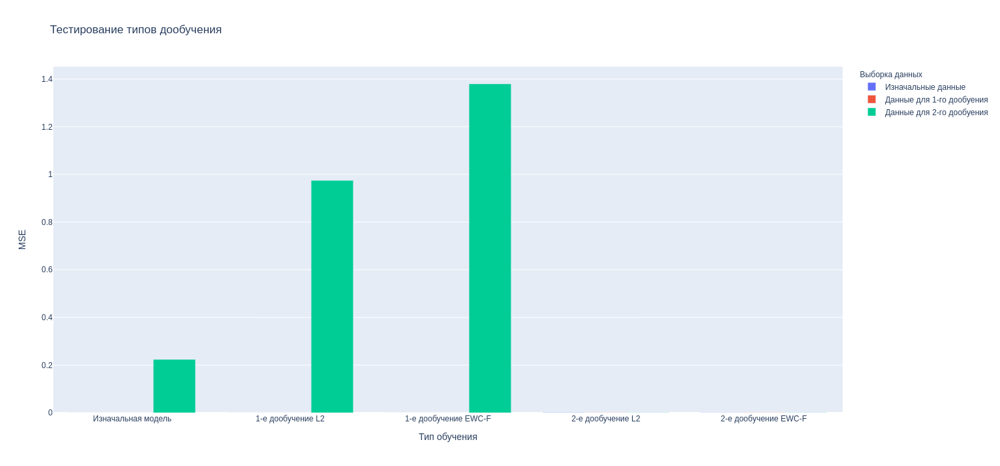

In [339]:
fig = px.bar(tests_mse, barmode='group',
       labels={
           "value": "MSE",
           "index": "Тип обучения",
           "variable": "Выборка данных"
       },
       title="Тестирование типов дообучения")

fig.update_layout(
  autosize=False,
  width=1500,
  height=700,
)

display(Image(PLOTLY_SCOPE.transform(fig, format="png", scale=1)))

In [314]:
px.bar(tests_mse, barmode='group',
       labels={
           "value": "MSE",
           "index": "Тип обучения",
           "variable": "Выборка данных"
       },
       title="Тестирование типов дообучения")

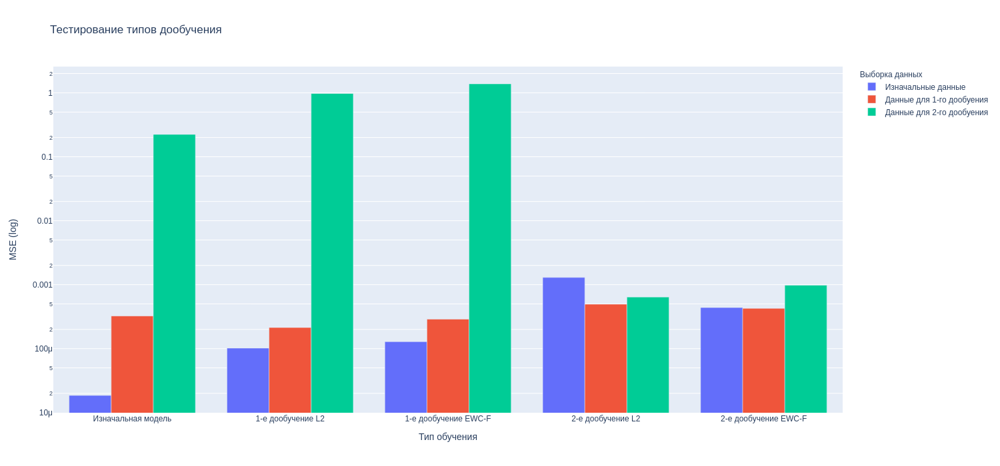

In [340]:
fig = px.bar(tests_mse, barmode='group', log_y=True,
       labels={
           "value": "MSE (log)",
           "index": "Тип обучения",
           "variable": "Выборка данных"
       },
       title="Тестирование типов дообучения")

fig.update_layout(
  autosize=False,
  width=1500,
  height=700,
)

display(Image(PLOTLY_SCOPE.transform(fig, format="png", scale=1)))

In [318]:
px.bar(tests_mse, barmode='group', log_y=True,
       labels={
           "value": "MSE (log)",
           "index": "Тип обучения",
           "variable": "Выборка данных"
       },
       title="Тестирование типов дообучения")

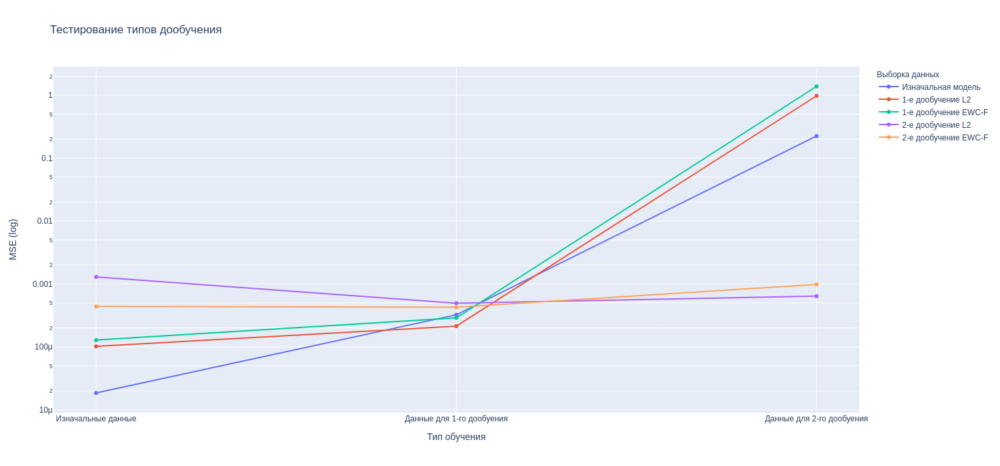

In [341]:
fig = px.line(tests_mse.T, log_y=True, markers=True,
        labels={
            "value": "MSE (log)",
            "index": "Тип обучения",
            "variable": "Выборка данных"
        },
        title="Тестирование типов дообучения")

fig.update_layout(
  autosize=False,
  width=1500,
  height=700,
)

display(Image(PLOTLY_SCOPE.transform(fig, format="png", scale=1)))

In [323]:
px.line(tests_mse.T, log_y=True, markers=True,
        labels={
            "value": "MSE (log)",
            "index": "Тип обучения",
            "variable": "Выборка данных"
        },
        title="Тестирование типов дообучения")

## Вывод

В нашем случае EWC-F проявила себя не во всей красе, но показала результаты лучше при втором дообучении. L2 показал себя относительно хорошо, но по опыту отмечу, что L2 порой полностью проваливается, тогда как EWC-F справляется во всех случаях. Результаты дообучения можно очень сильно улучшить, если подбирать гиперпараметры. Это можно сделать в ручную или с помощью keras_tuner